In [1]:
# on 30 epochs

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
from sklearn.cluster import KMeans 
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import MinMaxScaler

In [3]:
syn_bean_data = pd.read_csv("merged_syn_data.csv")
x = syn_bean_data.iloc[:, [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]].values

syn_bean_data.info()
print("syn_bean_data head", syn_bean_data.head())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2500 entries, 0 to 2499
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             2500 non-null   float64
 1   Perimeter        2500 non-null   float64
 2   MajorAxisLength  2500 non-null   float64
 3   MinorAxisLength  2500 non-null   float64
 4   AspectRation     2500 non-null   float64
 5   Eccentricity     2500 non-null   float64
 6   ConvexArea       2500 non-null   float64
 7   EquivDiameter    2500 non-null   float64
 8   Extent           2500 non-null   float64
 9   Solidity         2500 non-null   float64
 10  roundness        2500 non-null   float64
 11  Compactness      2500 non-null   float64
 12  ShapeFactor1     2500 non-null   float64
 13  ShapeFactor2     2500 non-null   float64
 14  ShapeFactor3     2500 non-null   float64
 15  ShapeFactor4     2500 non-null   float64
 16  Class            2500 non-null   object 
dtypes: float64(16)

In [4]:
#Frequency distribution of species"
syn_bean_data_outcome = pd.crosstab(index=syn_bean_data["Class"],  # Make a crosstab
                              columns="count")      # Name the count column

syn_bean_data_outcome

col_0,count
Class,
BARBUNYA,500
BOMBAY,500
CALI,500
HOROZ,500
SEKER,500


In [5]:
syn_bean_data_1 = syn_bean_data.loc[syn_bean_data["Class"]=="SEKER"]
syn_bean_data_2 = syn_bean_data.loc[syn_bean_data["Class"]=="BARBUNYA"]
syn_bean_data_3 = syn_bean_data.loc[syn_bean_data["Class"]=="BOMBAY"]
syn_bean_data_4 = syn_bean_data.loc[syn_bean_data["Class"]=="CALI"]
syn_bean_data_5 = syn_bean_data.loc[syn_bean_data["Class"]=="HOROZ"]

/Users/maqowais/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  func(*plot_args, **plot_kwargs)
/Users/maqowais/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  func(*plot_args, **plot_kwargs)
/Users

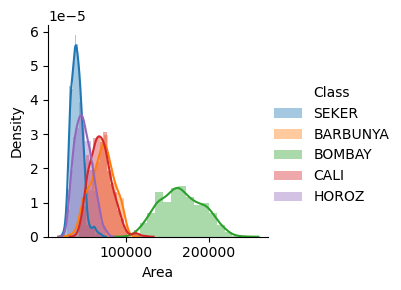

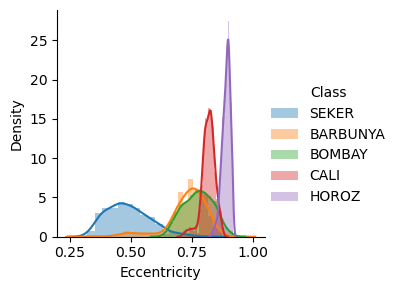

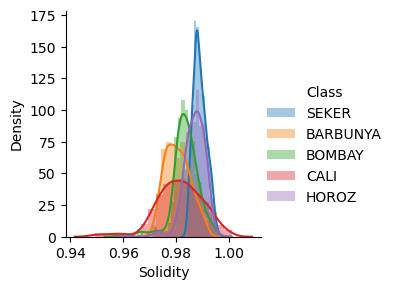

In [6]:
sns.FacetGrid(syn_bean_data,hue="Class",height=3).map(sns.distplot,"Area").add_legend()
sns.FacetGrid(syn_bean_data,hue="Class",height=3).map(sns.distplot,"Eccentricity").add_legend()
sns.FacetGrid(syn_bean_data,hue="Class",height=3).map(sns.distplot,"Solidity").add_legend()
plt.show()

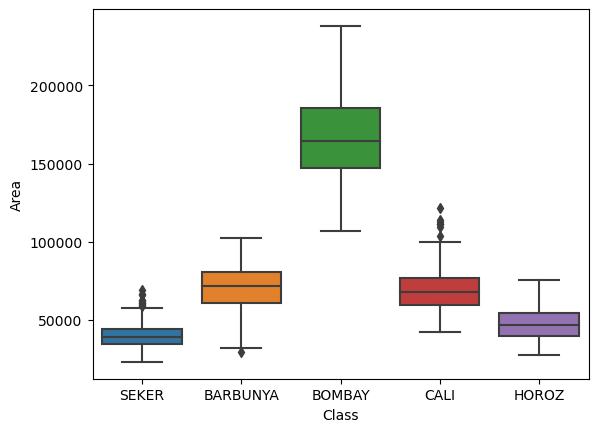

In [7]:
sns.boxplot(x="Class",y="Area",data=syn_bean_data)
plt.show()

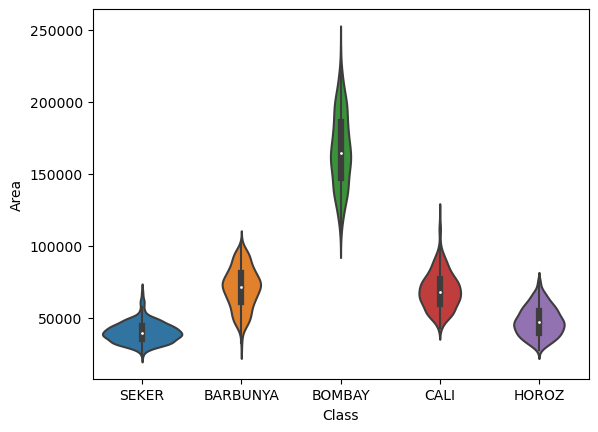

In [8]:
sns.violinplot(x="Class",y="Area",data=syn_bean_data)
plt.show()

/Users/maqowais/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:2095: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
/Users/maqowais/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


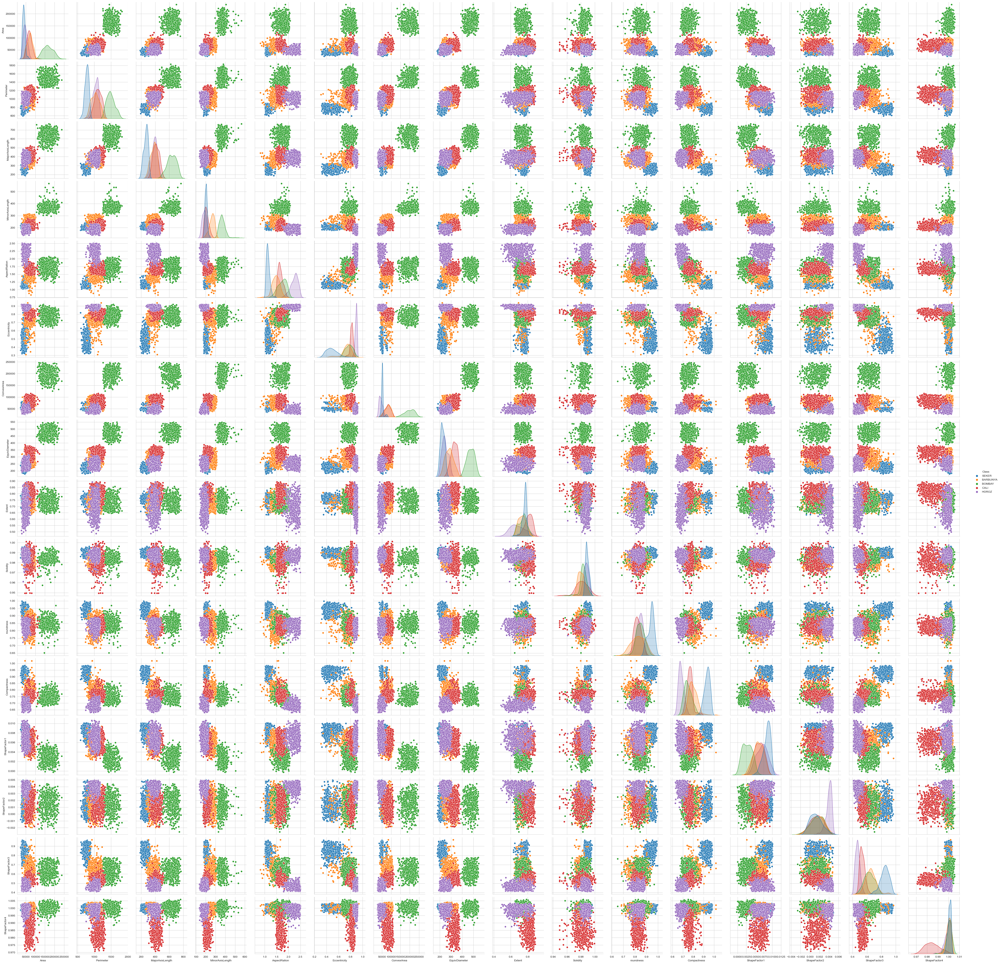

In [9]:
sns.set_style("whitegrid")
sns.pairplot(syn_bean_data,hue="Class",size=3);
plt.show()

In [10]:
#Finding the optimum number of clusters for k-means classification
from sklearn.cluster import KMeans
wcss = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(x)
    wcss.append(kmeans.inertia_)


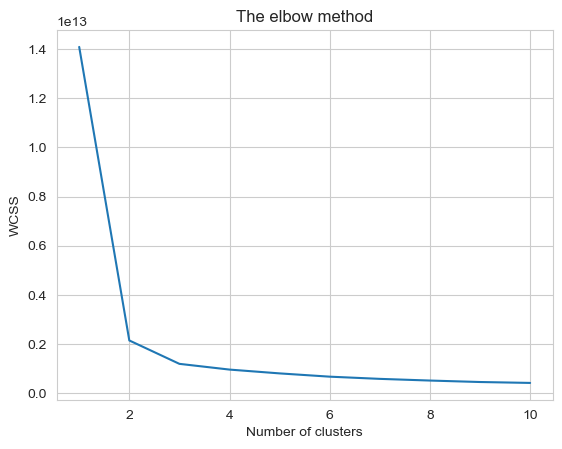

In [11]:
plt.plot(range(1, 11), wcss)
plt.title('The elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS') #within cluster sum of squares
plt.show()


In [12]:
kmeans = KMeans(n_clusters = 5, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
y_kmeans = kmeans.fit_predict(x)

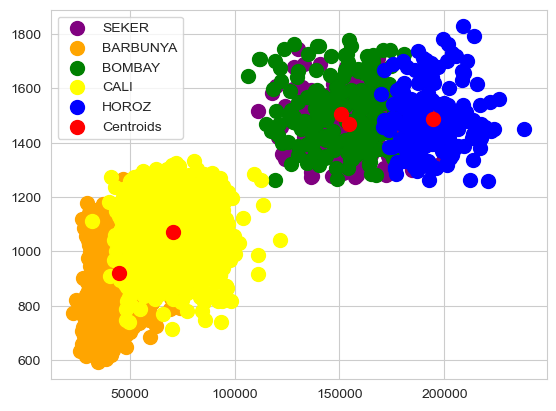

In [13]:
#Visualising the clusters
plt.scatter(x[y_kmeans == 0, 0], x[y_kmeans == 0, 1], s = 100, c = 'purple', label = 'SEKER')
plt.scatter(x[y_kmeans == 1, 0], x[y_kmeans == 1, 1], s = 100, c = 'orange', label = 'BARBUNYA')
plt.scatter(x[y_kmeans == 2, 0], x[y_kmeans == 2, 1], s = 100, c = 'green', label = 'BOMBAY')
plt.scatter(x[y_kmeans == 3, 0], x[y_kmeans == 3, 1], s = 100, c = 'yellow', label = 'CALI')
plt.scatter(x[y_kmeans == 4, 0], x[y_kmeans == 4, 1], s = 100, c = 'blue', label = 'HOROZ')

#Plotting the centroids of the clusters
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:,1], s = 100, c = 'red', label = 'Centroids')

plt.legend()

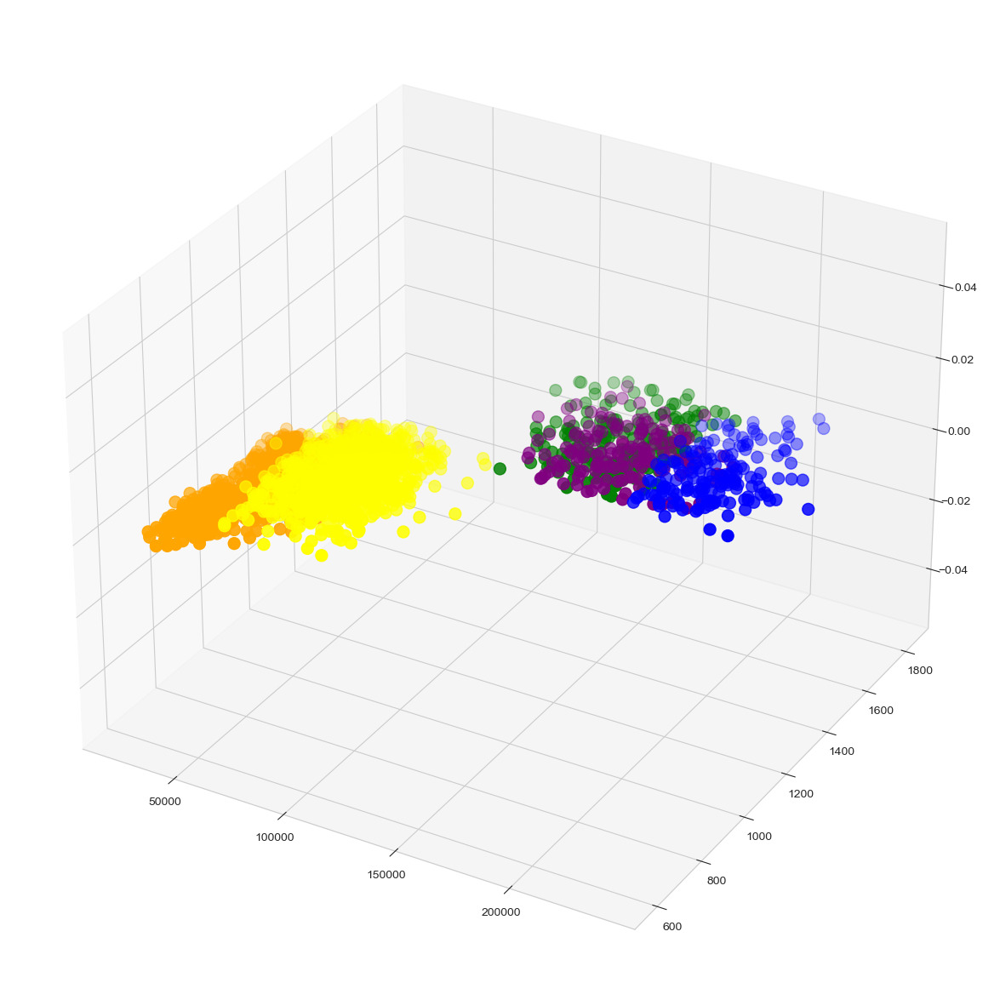

In [14]:
# 3d scatterplot using matplotlib

fig = plt.figure(figsize = (15,15))
ax = fig.add_subplot(111, projection='3d')

plt.scatter(x[y_kmeans == 0, 0], x[y_kmeans == 0, 1], s = 100, c = 'purple', label = 'SEKER')
plt.scatter(x[y_kmeans == 1, 0], x[y_kmeans == 1, 1], s = 100, c = 'orange', label = 'BARBUNYA')
plt.scatter(x[y_kmeans == 2, 0], x[y_kmeans == 2, 1], s = 100, c = 'green', label = 'BOMBAY')
plt.scatter(x[y_kmeans == 3, 0], x[y_kmeans == 3, 1], s = 100, c = 'yellow', label = 'CALI')
plt.scatter(x[y_kmeans == 4, 0], x[y_kmeans == 4, 1], s = 100, c = 'blue', label = 'HOROZ')

#Plotting the centroids of the clusters
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:,1], s = 100, c = 'red', label = 'Centroids')
plt.show()